In [3]:
#!pip install plotly

import json
import pandas as pd
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import warnings

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from urllib.request import urlopen

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

warnings.filterwarnings(action='ignore')

In [41]:
# Load dataset and display top 5 rows

df_covid=pd.read_csv("us_counties_covid19_daily.csv")
covid_cases = df_covid
df_covid.head()

,date,county,state,fips,cases,deaths
0,2020-01-21,Snohomish,Washington,53061.0,1,0.0
1,2020-01-22,Snohomish,Washington,53061.0,1,0.0
2,2020-01-23,Snohomish,Washington,53061.0,1,0.0
3,2020-01-24,Cook,Illinois,17031.0,1,0.0
4,2020-01-24,Snohomish,Washington,53061.0,1,0.0


In [5]:
df_covid.tail()

,date,county,state,fips,cases,deaths
800432,2020-12-05,Sweetwater,Wyoming,56037.0,2098,10.0
800433,2020-12-05,Teton,Wyoming,56039.0,1739,2.0
800434,2020-12-05,Uinta,Wyoming,56041.0,1187,5.0
800435,2020-12-05,Washakie,Wyoming,56043.0,519,8.0
800436,2020-12-05,Weston,Wyoming,56045.0,419,2.0


# EDA


In [6]:
# Discover missing values

df_covid.isnull().sum()

date          0
county        0
state         0
fips       7591
cases         0
deaths    16733
dtype: int64

In [7]:
# Fill missing values with median

# method = 'pad' 바로 앞에꺼 값을 결측치로 대체하는 것
# mean 보다 median이 이상치의 영향을 덜 받는 특징때문에 median을 사용했다.

df_covid['fips'] = df_covid['fips'].fillna(method = 'pad')# The values of 'fips' are mostly similiar to values next to each other 
df_covid['deaths'] = df_covid['deaths'].fillna(df_covid['deaths'].median())

In [8]:
# 시각화를 위해서 결측치 제거전 df를  미리 만들어 놓기 
df = df_covid

In [9]:
# drop death, fips variable ( death는 예측하려는 변수가 아니여서 제거, fips는 state와 일치하는 변수임으로 제거)
df_covid = df_covid.drop('deaths', axis=1, inplace=False)
df_covid = df_covid.drop('fips', axis=1, inplace=False)

In [10]:
# check missing values again

df_covid.isnull().sum()

date      0
county    0
state     0
cases     0
dtype: int64

In [11]:
# Discover data type

df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800437 entries, 0 to 800436
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    800437 non-null  object
 1   county  800437 non-null  object
 2   state   800437 non-null  object
 3   cases   800437 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 24.4+ MB


In [12]:
df_covid.describe()

,cases
count,800437.000000
mean,1589.667358
std,8385.201329
min,0.000000
25%,29.000000
50%,175.000000
75%,775.000000
max,439538.000000


In [13]:
df_covid.cases


0            1
1            1
2            1
3            1
4            1
          ... 
800432    2098
800433    1739
800434    1187
800435     519
800436     419
Name: cases, Length: 800437, dtype: int64

# Distribution

<AxesSubplot:title={'center':'Target: covid cases'}, xlabel='cases', ylabel='Density'>

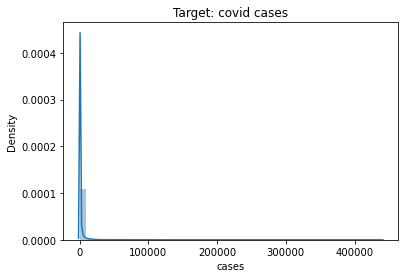

In [14]:
# Original target variable histogram

plt.title('Target: covid cases')
sns.distplot(df_covid['cases'])

<AxesSubplot:title={'center':'Log Transformed Target: covid cases'}, xlabel='cases', ylabel='Density'>

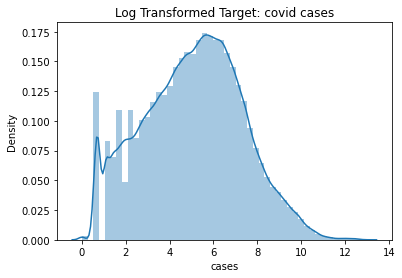

In [15]:
# Log transformed target variable histogram

log_covid = np.log1p(df_covid['cases'])

plt.title('Log Transformed Target: covid cases')
sns.distplot(log_covid)

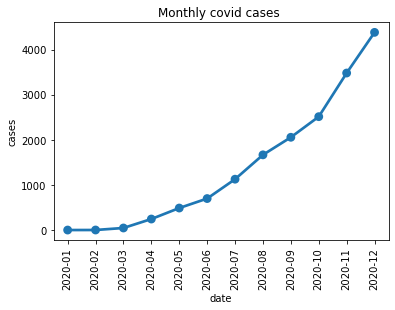

In [84]:
# Discover monthly covid cases

df_date = df_covid[['date', 'cases']].copy()
df_date.date = pd.to_datetime(df_date.date) 
df_date.set_index('date', inplace=True)
df_date = df_date.resample('MS').mean().reset_index()

plt.title("Monthly covid cases ")
labels = df_date.date.dt.to_period('M')
date_plot = sns.pointplot(data=df_date, x='date', y='cases').set_xticklabels(rotation=90, labels=labels)

[Text(0, 0, '2020-01'),
 Text(1, 0, '2020-02'),
 Text(2, 0, '2020-03'),
 Text(3, 0, '2020-04'),
 Text(4, 0, '2020-05'),
 Text(5, 0, '2020-06'),
 Text(6, 0, '2020-07'),
 Text(7, 0, '2020-08'),
 Text(8, 0, '2020-09'),
 Text(9, 0, '2020-10'),
 Text(10, 0, '2020-11'),
 Text(11, 0, '2020-12'),
 Text(12, 0, ''),
 Text(13, 0, ''),
 Text(14, 0, ''),
 Text(15, 0, ''),
 Text(16, 0, ''),
 Text(17, 0, ''),
 Text(18, 0, ''),
 Text(19, 0, ''),
 Text(20, 0, ''),
 Text(21, 0, ''),
 Text(22, 0, ''),
 Text(23, 0, ''),
 Text(24, 0, ''),
 Text(25, 0, ''),
 Text(26, 0, ''),
 Text(27, 0, ''),
 Text(28, 0, ''),
 Text(29, 0, ''),
 Text(30, 0, ''),
 Text(31, 0, ''),
 Text(32, 0, ''),
 Text(33, 0, ''),
 Text(34, 0, ''),
 Text(35, 0, ''),
 Text(36, 0, ''),
 Text(37, 0, ''),
 Text(38, 0, ''),
 Text(39, 0, ''),
 Text(40, 0, ''),
 Text(41, 0, ''),
 Text(42, 0, ''),
 Text(43, 0, ''),
 Text(44, 0, ''),
 Text(45, 0, ''),
 Text(46, 0, ''),
 Text(47, 0, ''),
 Text(48, 0, ''),
 Text(49, 0, ''),
 Text(50, 0, ''),
 Text(51

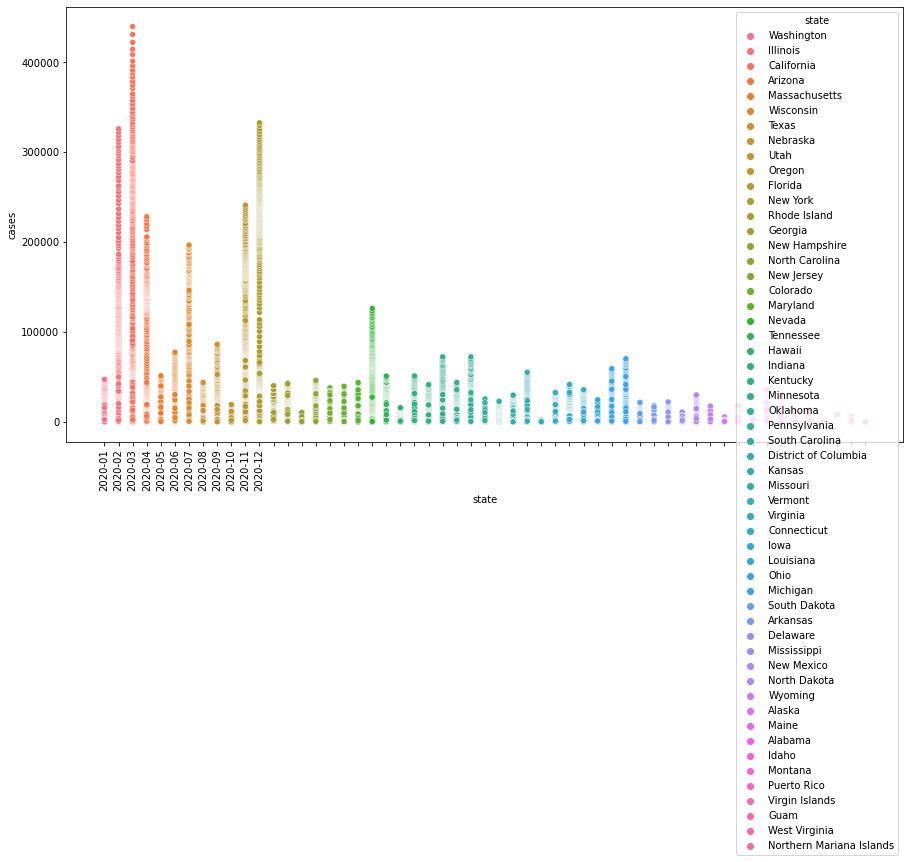

In [19]:
# the number of cases by state

fig,(ax1)= plt.subplots(nrows=1)
fig.set_size_inches(15,8)

sns.scatterplot(data=df_covid, x='state', y='cases', hue='state', ax=ax1).set_xticklabels(rotation=90, labels=labels)

[Text(0, 0, '2020-01'),
 Text(1, 0, '2020-02'),
 Text(2, 0, '2020-03'),
 Text(3, 0, '2020-04'),
 Text(4, 0, '2020-05'),
 Text(5, 0, '2020-06'),
 Text(6, 0, '2020-07'),
 Text(7, 0, '2020-08'),
 Text(8, 0, '2020-09'),
 Text(9, 0, '2020-10'),
 Text(10, 0, '2020-11'),
 Text(11, 0, '2020-12'),
 Text(12, 0, ''),
 Text(13, 0, ''),
 Text(14, 0, ''),
 Text(15, 0, ''),
 Text(16, 0, ''),
 Text(17, 0, ''),
 Text(18, 0, ''),
 Text(19, 0, ''),
 Text(20, 0, ''),
 Text(21, 0, ''),
 Text(22, 0, ''),
 Text(23, 0, ''),
 Text(24, 0, ''),
 Text(25, 0, ''),
 Text(26, 0, ''),
 Text(27, 0, ''),
 Text(28, 0, ''),
 Text(29, 0, ''),
 Text(30, 0, ''),
 Text(31, 0, ''),
 Text(32, 0, ''),
 Text(33, 0, ''),
 Text(34, 0, ''),
 Text(35, 0, ''),
 Text(36, 0, ''),
 Text(37, 0, ''),
 Text(38, 0, ''),
 Text(39, 0, ''),
 Text(40, 0, ''),
 Text(41, 0, ''),
 Text(42, 0, ''),
 Text(43, 0, ''),
 Text(44, 0, ''),
 Text(45, 0, ''),
 Text(46, 0, ''),
 Text(47, 0, ''),
 Text(48, 0, ''),
 Text(49, 0, ''),
 Text(50, 0, ''),
 Text(51

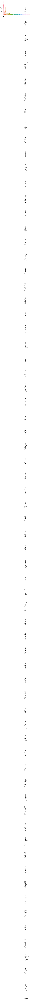

In [82]:
fig,(ax2)= plt.subplots(nrows=1)
fig.set_size_inches(15,8)

sns.scatterplot(data=df_covid, x='county', y='cases', hue='county', ax=ax2).set_xticklabels(rotation=90, labels=labels)

In [83]:
df_fips = df.groupby('fips').max()['cases'].reset_index()

fig = px.choropleth_mapbox(df_fips, geojson=counties, locations='fips', color='cases',
                           #geoJSON은 위치정보를 갖는 점을 기반으로 체계적으로 지형을 표현하기 위해 설계된 개방형 공개 표준 형식
                           color_continuous_scale="Viridis", #색상
                           range_color=(0, 8000),# 색상 범위
                           mapbox_style="carto-positron",#맵 스타일 
                           zoom=3.5, center = {"lat": 37.0902, "lon": -95.7129}, # 시작 위치 
                           opacity=0.5, #불투명도
                           labels={'cases':'cases'} # {나타낼 속성 : 지정할 라벨}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#https://plotly.com/python/mapbox-county-choropleth/

In [52]:
max(df_fips.cases)

439538

# Preprocessing

In [53]:
# Test data transformation (get dummy variables from date variable)

def preprocess(df):
    # To right date format
    df2 = df.copy()
    df2.date = df2.date.apply(pd.to_datetime)
    df2['year'] = df2.date.apply(lambda x: x.year)
    df2['month'] = df2.date.apply(lambda x: x.month)
    df2['day'] = df2.date.apply(lambda x: x.day)
    df2.drop(['date'], axis=1, inplace=True)
    
    #original_target = df2['cases']
    #df2['case'] = np.log1p(df2['cases'])
    
    # Transform dummy variable
    df2 = pd.get_dummies(df2, columns=['year', 'month', 'day','county','state'])
    
    return df2

In [54]:
df_covid

,date,county,state,cases
0,2020-01-21,Snohomish,Washington,1
1,2020-01-22,Snohomish,Washington,1
2,2020-01-23,Snohomish,Washington,1
3,2020-01-24,Cook,Illinois,1
4,2020-01-24,Snohomish,Washington,1
...,...,...,...,...
800432,2020-12-05,Sweetwater,Wyoming,2098
800433,2020-12-05,Teton,Wyoming,1739
800434,2020-12-05,Uinta,Wyoming,1187
800435,2020-12-05,Washakie,Wyoming,519


In [56]:
# Preprocess 

df_covid_preprocessed = preprocess(df_covid)
df_covid_preprocessed

,cases,year_2020,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,...,state_Tennessee,state_Texas,state_Utah,state_Vermont,state_Virgin Islands,state_Virginia,state_Washington,state_West Virginia,state_Wisconsin,state_Wyoming
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800432,2098,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
800433,1739,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
800434,1187,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
800435,519,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [30]:
df_covid_preprocessed.isnull().sum()

cases                  0
year_2020              0
month_1                0
month_2                0
month_3                0
                      ..
state_Virginia         0
state_Washington       0
state_West Virginia    0
state_Wisconsin        0
state_Wyoming          0
Length: 2029, dtype: int64

# Regression Models

In [ ]:
# Split preprocessed dataset

y_PP = df_covid_preprocessed['cases']
X_PP = df_covid_preprocessed.drop('cases', axis=1, inplace=False)

X_train_PP, X_test_PP, y_train_PP, y_test_PP = train_test_split(X_PP, y_PP, test_size=0.2, random_state=156)

In [ ]:
# Define functions to calculate metrics

def evaluate(model, X_test, y_test, exp):
    # return np.expm1 for log normalized data
    if exp:
        pred = np.expm1(model.predict(X_test))
        y_true = np.expm1(y_test)

        MSE = mean_squared_error(y_true, pred)
        MAE = mean_absolute_error(y_true, pred)
        R_2 = r2_score(y_true, pred)

        print("Model - {} -".format(model), "MSE: {0:3f}, MAE: {1:3f}, R Squared: {2:3f}".format(MSE, MAE, R_2))
        
        return MSE, MAE, R_2
        
    else:
        pred = model.predict(X_test)
        y_true = y_test

        MSE = mean_squared_error(y_true, pred)
        MAE = mean_absolute_error(y_true, pred)
        R_2 = r2_score(y_true, pred)

        print("Model - {} -".format(model), "MSE: {0:3f}, MAE: {1:3f}, R Squared: {2:3f}".format(MSE, MAE, R_2))
        
        return MSE, MAE, R_2

In [ ]:
# Model train - Linear Regression with propossed data

model_lr = LinearRegression()
model_lr.fit(X_train_PP,y_train_PP)

In [ ]:
LINEAR =  evaluate(model_lr, X_test=X_test_PP, y_test=y_test_PP, exp=False)

In [ ]:
# Model train - Ridge

model_ridge = Ridge()
model_ridge.fit(X_train_PP, y_train_PP)

In [ ]:
# Model train - Lasso

model_lasso = Lasso()
model_lasso.fit(X_train_PP, y_train_PP)

In [ ]:
RIDGE = evaluate(model_ridge, X_test=X_test_PP, y_test=y_test_PP, exp=False)
LASSO = evaluate(model_lasso, X_test=X_test_PP, y_test=y_test_PP, exp=False)

LINEAR,RIDGE,LASSO 중에서 LASSO가 제일 낮음을 알 수 있다.

# Hyper Parameter Tuning

In [ ]:
def find_best_alpha(MODEL, PARAMS, CV=10):
    # GridSearchCV to find best alpha
    grid = GridSearchCV(MODEL, PARAMS, cv=CV, return_train_score=True, scoring='neg_mean_squared_error')
    grid.fit(X_PP, y_PP)
    mse = -1 * grid.best_score_
    best_alpha = grid.best_params_
    
    alphas = PARAMS['alpha']
    
    train_scores_mean = grid.cv_results_["mean_train_score"]
    train_scores_std = grid.cv_results_["std_train_score"]
    test_scores_mean = grid.cv_results_["mean_test_score"]
    test_scores_std = grid.cv_results_["std_test_score"]
    
    plt.figure()
    plt.title('Model')
    plt.xlabel('$\\alpha$ (alpha)')
    plt.ylabel('Score')

    # plot train scores
    plt.semilogx(alphas, train_scores_mean, label='Mean Train score',
                 color='navy')

    # create a shaded area between [mean - std, mean + std]
    plt.gca().fill_between(alphas,
                           train_scores_mean - train_scores_std,
                           train_scores_mean + train_scores_std,
                           alpha=0.2,
                           color='navy')
    plt.semilogx(alphas, test_scores_mean,
                 label='Mean Test score', color='darkorange')

    # create a shaded area between [mean - std, mean + std]
    plt.gca().fill_between(alphas,
                           test_scores_mean - test_scores_std,
                           test_scores_mean + test_scores_std,
                           alpha=0.2,
                           color='darkorange')

    plt.legend(loc='best')
    plt.show()
    
    print("Best MSE: {:.2f}".format(grid.best_score_))
    print("Best Alpha: ", grid.best_params_)

In [ ]:
ridge_params = {'alpha':np.logspace(-3, 3, 7)}
find_best_alpha(Ridge(), ridge_params)

# Final Model with Best Alpha

In [45]:
# fitting ridge with best alpha=100

model_ridge3 = Ridge(alpha=100)
model_ridge3.fit(X_PP, y_PP)
RIDGE_BEST = evaluate(model_ridge3, X_test=X_test_PP, y_test=y_test_PP, exp=False)

MemoryError: Unable to allocate 12.1 GiB for an array with shape (2030, 800437) and data type float64

# Summary of Result

In [47]:
# Model comparison 

df_conclusion = pd.DataFrame(columns=['MSE', 'MAE', 'R_Squared'])
df_conclusion = df_conclusion.append(pd.Series(list(LINEAR), index=df_conclusion.columns), ignore_index=True)
df_conclusion = df_conclusion.append(pd.Series(list(RIDGE), index=df_conclusion.columns), ignore_index=True)
df_conclusion = df_conclusion.append(pd.Series(list(RIDGE_BEST), index=df_conclusion.columns), ignore_index=True)
df_conclusion = df_conclusion.append(pd.Series(list(LASSO), index=df_conclusion.columns), ignore_index=True)
df_conclusion['Model'] = ['LINEAR', 'RIDGE','LASSO']
df_conclusion = df_conclusion[['Model', 'MSE', 'MAE', 'R_Squared']]
df_conclusion.set_index('Model', inplace=True)
display(df_conclusion)

,MSE,MAE,R_Squared
Model,,,
LINEAR,1.359817e+07,1057.921541,0.814883
RIDGE,1.360091e+07,1058.811013,0.814845
LASSO,1.428487e+07,1081.651878,0.805534


<AxesSubplot:xlabel='Model'>

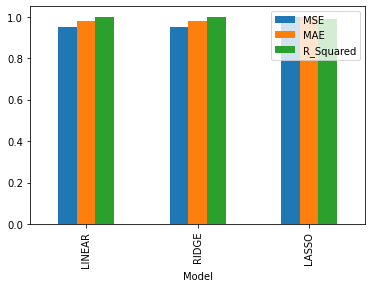

In [48]:
# THIS PLOT IS NORMALIZED
df_conclusion.apply(lambda x: x/x.max(), axis=0).plot(kind='bar')

In [ ]:
#LINEAR가 제일 점수가 높고 LASSO가 점수가 제일 낮았다.
하지만 전반적으로 R^2가 0.8 점 이상으로 높게 나와서 세 가지 모델 모두 예측력이 있다는 것을 알 수 있다.